# Lab Assignment Two: Exploring Image Data

Group Members: Mingming Li, Jiayin Liu, Tianlei Xu, He Zhou  
  Feb.18, 2018

# 1. Business Understanding

The dataset used in this assignment is the Caltech 101 dataset, which was collected in September 2003 by Fei-Fei Li, Marco Andreetto, and Marc 'Aurelio Ranzato (1). The dataset contains a total of 9,146 digital images of objects belonging to 101 categories (faces, watches, ants, pianos, etc). There are about 40 to 800 images per category, with most categories about 50 images. The size of each image is roughly 300 by 200 pixels. 

The Caltech 101 data set was used to train and test several computer vision recognition and classification algorithms (2). Most computer vision and machine learning algorithms work by training on a large and varied set of training data. However, most data sets used in computer vision research have tailored to the specific needs of the project being worked on. Each data set has differences in image size, image quality, relative location of objects within images and level of occlusion and clutter. These different properties make reported results from different methods hard to compare directly. The Caltech 101 data set was collected to alleviate these problems. Images are uniform in image size and relative position of interest objects. The categories represented are large. Detailed object outlines are marked. More than 10 computer vision papers have reported using Caltech 101 data set (2). 

The prediction task in this assignment is to build an image classification algorithm which takes an image as input and classifies it into one of the output categories. But this is actually a hard problem to solve with a computer. The difficulty is to enable a machine to recognize objects and object categories in images. A good image classification algorithm would be helpful for this task. The labeled image data are essential for training the algorithm. The Caltech 101 data set has the advantages of uniform size and presentation, low level of clutter/occlusion, many categories (sufficient for our use) and detailed annotations. The data set is suitable for our use of recognition algorithms. 

In the modeling, we will use principal components analysis (PCA) and Kernel PCA to get the eigen images. By comparing the representation of these two methods, we will know which method is better at representing the images with fewer components for the dataset used. We will use DAISY to perform feature extraction upon the images. Then we will use a heat map of the pairwise differences (ordered by class) among all extracted features. The colored boxes would indicate lowest distances in the diagonal line if the features extracted are representative. The quality of prediction algorithm will highly depend on both the dimension reduction methods and the feature extraction methods. 

# 2. Data Preparation

# 2.1 Data Input and Transformation

Since the Caltech 101 data set contains many categories and many images, we will use iamges of 16 categories. The data set we used are totally 1078 images, including images of butterfly, crab, crayfish, crocodile, dolphin, elephant, leopard, lotus, panda, pegeon, rhion, rooster, scorpion, seahorse, starfish, and sunflower. 

The first step is to read in the images as numpy arrays. 

In [9]:
import numpy as np
from skimage import color,transform,io
import matplotlib.pyplot as plt
im = 'D:/Machine learning/data/*.jpg'
images = io.ImageCollection(im)

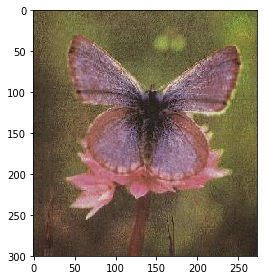

In [10]:
io.imshow(images[11])

In [11]:
plt.show()

In [12]:
def convert_gray(f):
    rgb = io.imread(f)
    gray=color.rgb2gray(rgb)  
    dst=transform.resize(gray,(512,512))
    dst = np.sqrt(dst / float(np.max(dst)))  
    return dst
Images =io.ImageCollection(im,load_func=convert_gray)

D:\Anaco\lib\site-packages\skimage\transform\_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


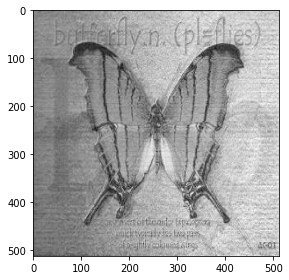

In [13]:
io.imshow(Images[13])
plt.show()

D:\Anaco\lib\site-packages\skimage\transform\_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
D:\Anaco\lib\site-packages\skimage\util\dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


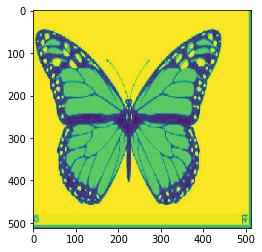

In [14]:
#plt.imshow(Images[13])
from skimage import img_as_ubyte  
dst_1 = img_as_ubyte(Images[16])
Images[16]
dst_1
plt.imshow(dst_1)

# 2.2 Image Visualization

We wiil visualize 10 images, each from 1 category.

D:\Anaco\lib\site-packages\skimage\transform\_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


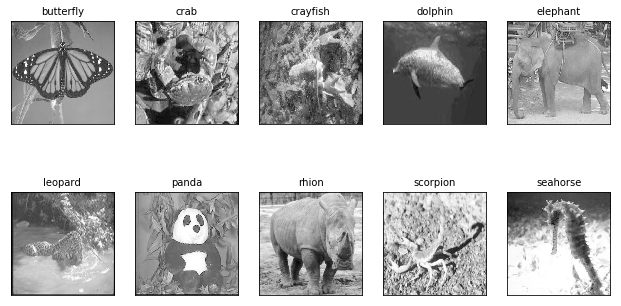

In [15]:
%matplotlib inline
from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd

label = pd.read_excel('D:/Machine learning/label.xlsx')
# a helper plotting function

def plot_gallery(images, titles,k,n_row=2, n_col=5):
    plt.figure(figsize=(1.7 * n_col, 2.3 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        t=i*k
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[t].reshape((512,512)), cmap=plt.cm.gray)
        plt.title(titles[t], size=10)
        plt.xticks(())
        plt.yticks(())

plot_gallery(Images, label['label'],100)

The 10 categories we visualized are butterfly, crab, crayfish, dolphin, elephant, leopard, panda, rhion, scorpion, and seahorse. The grey scaled images are pretty distinguishable for each category.

# 2.3 One-Dimension Transformation

We will linearize the images to create a table of 1-D image features. Each row of is one image. The image sizes are about 300 by 200 pixels, which provide 32x32=1024 pixels per image. We will use each pixel location in the image as a separate feature.

In [16]:
images_1d = np.zeros((len(Images),\
                      Images[0].shape[0] * Images[0].shape[1]))

for i in range(len(Images)):
    images_1d[i] = Images[i].ravel()

D:\Anaco\lib\site-packages\skimage\transform\_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


# 3. Data Reduction

## 3.1 Linear dimensionality reduction using PCA

In [17]:
#use full PCA to get top 300 components in new vector space.
from sklearn.decomposition import PCA

n_components = 300
print ("Extracting the top %d eigenimage from %d image" % (
    n_components, images_1d.shape[0]))

pca = PCA(n_components=n_components)
h, w = Images[0].shape
%time pca.fit(images_1d)
eigenimages = pca.components_.reshape((n_components, h, w))

Extracting the top 300 eigenimage from 1078 image


D:\Anaco\lib\site-packages\skimage\transform\_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


Wall time: 1min 38s


In [18]:
def plot_explained_variance(pca):
    import plotly
    from plotly.graph_objs import Scatter, Marker, Layout, XAxis, YAxis, Bar, Line
    plotly.offline.init_notebook_mode() # run at the start of every notebook
    
    explained_var = pca.explained_variance_ratio_
    cum_var_exp = np.cumsum(explained_var)
    
    plotly.offline.iplot({
        "data": [Bar(y=explained_var, name='individual explained variance'),
                 Scatter(y=cum_var_exp, name='cumulative explained variance')
            ],
        "layout": Layout(xaxis=XAxis(title='Principal components'), yaxis=YAxis(title='Explained variance ratio'))
    })
    
plot_explained_variance(pca)

As we can see from the picture, 50 components explain 80.2% of total variences.300 compunents can explain 93.5% variation in dataset.It's enough. So we need 300 dimensions.

Obviously as the eigenimages[i] increased, the eigenimages shows more details. Now we can reconstruct PCA images to see if 300 components are acceptable

In [19]:
def reconstruct_image(trans_obj,org_features):
    low_rep = trans_obj.transform(org_features)
    rec_image = trans_obj.inverse_transform(low_rep)
    return low_rep, rec_image
    
idx_to_reconstruct = 1019    
X_idx = images_1d[idx_to_reconstruct]
low_dimensional_representation, reconstructed_image = reconstruct_image(pca,X_idx.reshape(1, -1))


In [ ]:
plt.subplot(1,2,1)
plt.imshow(X_idx.reshape((h, w)), cmap=plt.cm.gray)
plt.title('Original')
plt.grid()
plt.subplot(1,2,2)
plt.imshow(reconstructed_image.reshape((h, w)), cmap=plt.cm.gray)
plt.title('Reconstructed from Full PCA')
plt.grid()
#label('label[100]')

The new image reconstructed from full PCA is acceptable

## 3.2 Non-linear dimensionality reduction using Kernel PCA

In [ ]:
from sklearn.decomposition import KernelPCA

n_components = 300
print ("Extracting the top %d eigenimages from %d images" % (n_components, images_1d.shape[0]))

kpca_loaded = KernelPCA(n_components=n_components, kernel='rbf', 
                fit_inverse_transform=True, gamma=50) # very sensitive to the gamma parameter
%time kpca_loaded.fit(images_1d)

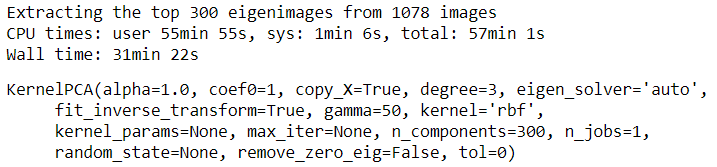

# 3.3PCA vs KPCA

In [ ]:
X = images_1d
n_samples = len(X)
import warnings
warnings.simplefilter('ignore', DeprecationWarning)

from ipywidgets import widgets  # make this interactive!
# compare the different methods

def plt_reconstruct(idx_to_reconstruct):
    idx_to_reconstruct = np.round(idx_to_reconstruct)
    
    reconstructed_image = pca.inverse_transform(pca.transform(X[idx_to_reconstruct].reshape(1, -1)))
    reconstructed_image_kpca = kpca_loaded.inverse_transform(kpca_loaded.transform(X[idx_to_reconstruct].reshape(1, -1)))
    
    plt.figure(figsize=(15,7))
    
    plt.subplot(1,3,1)
    plt.imshow(X[idx_to_reconstruct].reshape((h, w)), cmap=plt.cm.gray)
    plt.title('Original')
    plt.grid()
    
    plt.subplot(1,3,2)
    plt.imshow(reconstructed_image.reshape((h, w)), cmap=plt.cm.gray)
    plt.title('Full PCA')
    plt.grid()
    
    plt.subplot(1,3,3)
    plt.imshow(reconstructed_image_kpca.reshape((h, w)), cmap=plt.cm.gray)
    plt.title('Kernel PCA')
    plt.grid()
    
widgets.interact(plt_reconstruct,idx_to_reconstruct=(0,n_samples-1,1),__manual=True)

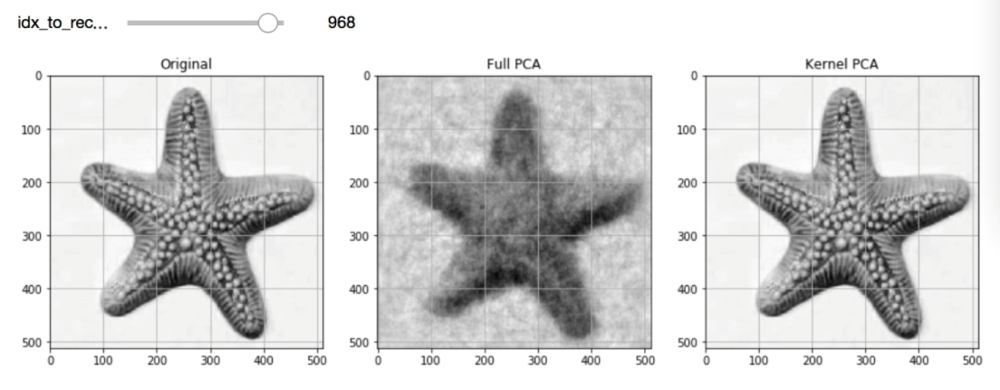

idx_to_rec = 0， Kernel PCA is better.

idx_to_rec = 99, Kernel PCA is better.

idx_to_rec = 178,Kernel PCA is better.

idx_to_rec = 273,Kernel PCA is better.

idx_to_rec = 412,Kernel PCA is better.

idx_to_rec = 560,Kernel PCA is better.

idx_to_rec = 656,Full PCA and Kernel PCA are similar.

idx_to_rec = 742,Kernel PCA is better.

idx_to_rec = 847,Full PCA and Kernel PCA are similar.

idx_to_rec = 968,Kernel PCA is better.

In most cases, Kernel PCA is better.In several cases,Full PCA and Kernel PCA are similar.It seems Kernel PCA is better.Kernel PCA lose less details so the reconstruction images of Kernel PCA are more ideal. On the other hand, Full PCA dimension only takes about 1 mins, while Kernel PCA takes about 1 hour.Kernel PCA CPU costs much more than Full PCA.
However,for our dataset, the pixel of our dataset image is 512*512,it's large enough for people to identify the reconstructed images of Full PCA.And Full PCA is fast.So we prefer Full PCA in this situation.If the size change, our choice may differ.

However,for our dataset, the pixel of our dataset image is 512*512, and we choose 300 components. It's large enough for people to identify the reconstructed images of Full PCA.And Full PCA is fast.So we prefer Full PCA in this situation.If the size change, and the number of components decreases to 50 or less,our choice may differ.

### 3.3 Daisy Feature Extraction 

DAISY feature extraction is mostly used in the face regonition. Because that the majority of the pictures we choosed are animals and flowers, so DAISY is efficient here for feature extraction.

In [ ]:
from skimage.io import imshow

idx_to_reconstruct = int(np.random.rand(1)*len(images_1d))
img  =images_1d[idx_to_reconstruct].reshape((h,w))
imshow(img)
plt.grid()

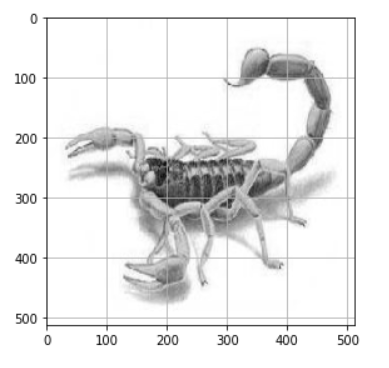

In [ ]:
from skimage.filters import sobel_h, sobel_v

gradient_mag = np.sqrt(sobel_v(img)**2 + sobel_h(img)**2 ) 
imshow(gradient_mag)
plt.grid()

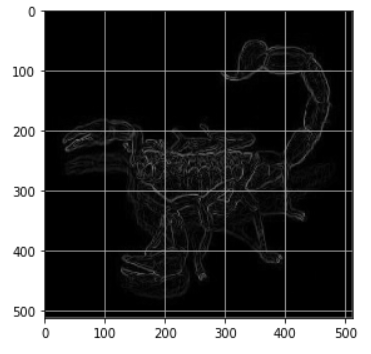

In [ ]:
from skimage.feature import daisy

# lets first visualize what the daisy descripto looks like
features, img_desc = daisy(img,step=20, radius=10, rings=3, histograms=4, orientations=8, visualize=True)
imshow(img_desc)
plt.grid()

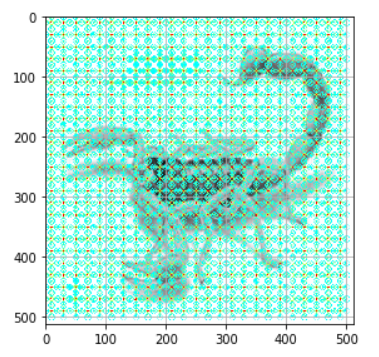

In [ ]:
features = daisy(img,step=20, radius=10, rings=2, histograms=4, orientations=8, visualize=False)
print(features.shape)
print(features.shape[0]*features.shape[1]*features.shape[2])

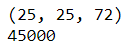

In [ ]:
def apply_daisy(row,shape):
    feat = daisy(row.reshape(shape),step=5, radius=20, rings=2, histograms=6, orientations=8, visualize=False)
    return feat.reshape((-1))

%time test_feature = apply_daisy(images_1d[3],(h,w))
test_feature.shape

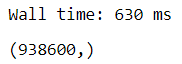

In [ ]:
# apply to entire data, row by row,
# takes about a minute to run
%time daisy_features = np.apply_along_axis(apply_daisy, 1, images_1d, (h,w))
print(daisy_features.shape)

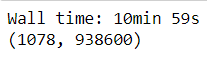

In [ ]:
from sklearn.metrics.pairwise import pairwise_distances
# find the pairwise distance between all the different image features
%time dist_matrix = pairwise_distances(daisy_features)

In [ ]:
import copy
# find closest image to current image
idx1 = 20
distances = copy.deepcopy(dist_matrix[idx1,:])
distances[idx1] = np.infty # dont pick the same image!
idx2 = np.argmin(distances)

plt.figure(figsize=(7,10))
plt.subplot(1,2,1)
imshow(images_1d[idx1].reshape((h,w)))
plt.title("Original Image")
plt.grid()

plt.subplot(1,2,2)
imshow(images_1d[idx2].reshape((h,w)))
plt.title("Closest Image")
plt.grid()

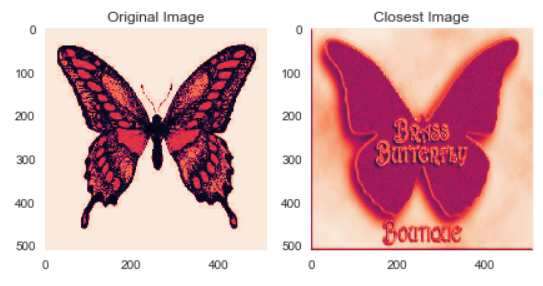

The pictures we choose have high pixel size. To get better result, we set the step small as 10, more number of  rings to get better result. As we can see from the graph, the DAISY cover most of the picture and is seemed to extract accurate feature from it.However, based on the result, we compare the label of original image and closet image, the rate of accurancy is just 3 per centage to 6 per centage. The rate may be a little low, we change the parameter of the DAISY and tried again, but the result didn't have much change. We check the closest image it conculated, and we analyzed it is because the data is not very good for this. The angel of pictures it photoed are different, some are from the above, some are from the front and some are from one side. The results in that some photoes, maybe not the same classification, but really similar.

In [ ]:
a =0
def accuracte(idx1):
    distances = copy.deepcopy(dist_matrix[idx1,:])
    distances[idx1] = np.infty # dont pick the same image!
    idx2 = np.argmin(distances)
    return idx2
for i in range(len(images_1d)):
    idx2 = accuracte(i)
    if label['label'][idx1]==label['label'][idx2]:
        a = a+1
acc =a/len(images_1d)
print(acc)

In [ ]:
import random
for i in range(20):
    idx1 = random.randint(0,1078)
    distances = copy.deepcopy(dist_matrix[idx1,:])
    distances[idx1] = np.infty # dont pick the same image!
    idx2 = np.argmin(distances)

    plt.figure(figsize=(7,10))
    plt.subplot(1,2,1)
    imshow(images_1d[idx1].reshape((h,w)))
    plt.title("Original Image")
    plt.grid()

    plt.subplot(1,2,2)
    imshow(images_1d[idx2].reshape((h,w)))
    plt.title("Closest Image")
    plt.grid()

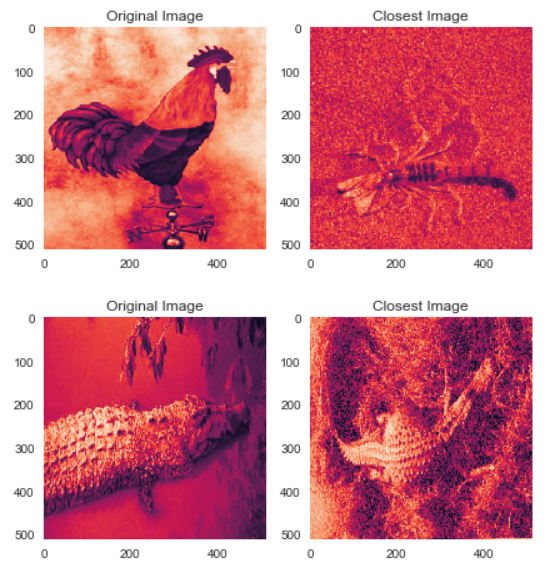

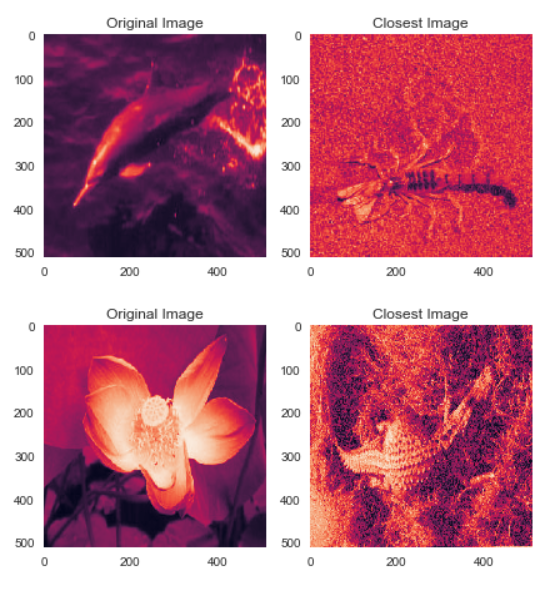

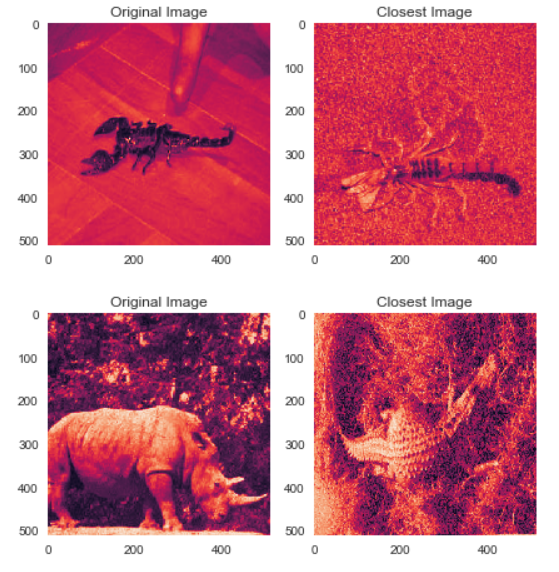

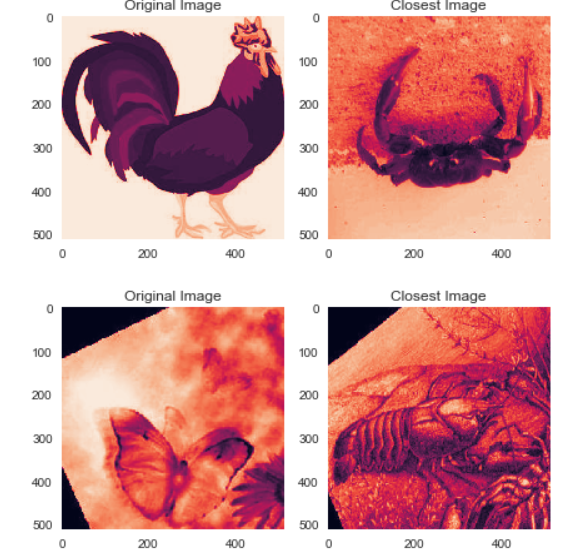

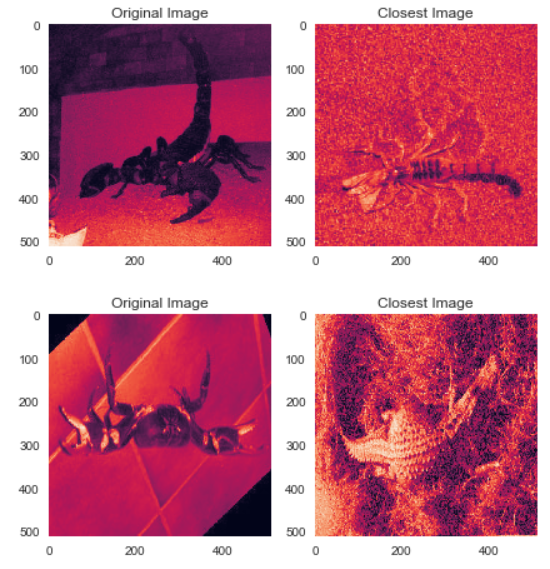

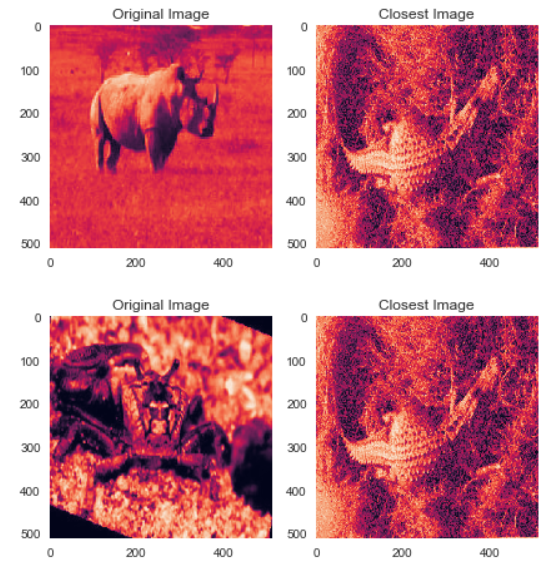

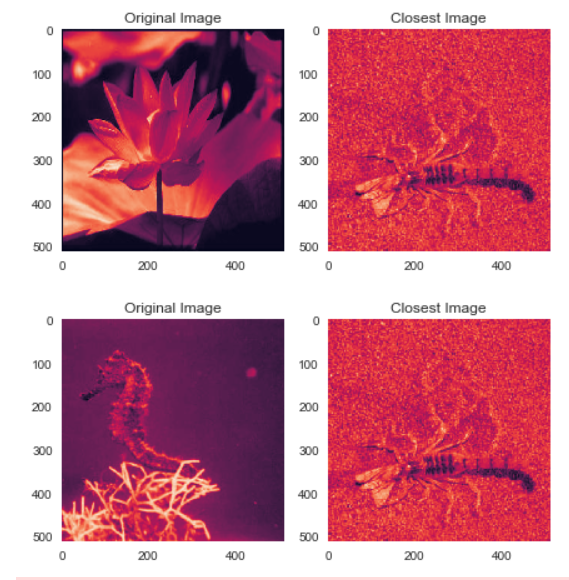

In [ ]:
from sklearn.metrics.pairwise import pairwise_distances

#generate the pairwise distance between all images under DAISY features extraction
Daisy = pairwise_distances(images_1d)
from sklearn import preprocessing

daisy_scaled = preprocessing.scale(Daisy)
%pylab inline
sns.set(style="darkgrid")
fig, ax = plt.subplots(figsize=(9, 9))

cax = ax.imshow(daisy_scaled, interpolation='nearest', cmap=cmap)
cbar = fig.colorbar(cax, ticks=[-5,0])
cbar.ax.set_yticklabels(['0', '5'])
ax.set_title('Heat Map of Daisy feature extraction')

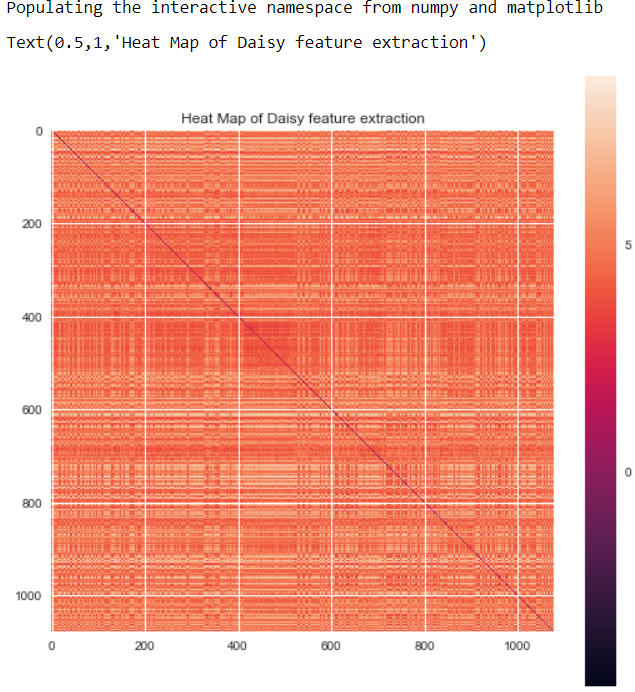

The heat map shows that, DAISY feature extraction can't distinguish the features between different labels properly. Different pictures in different classifiction could have the same features after the process of DAISY. If the result corrspond to expection, different labels should have obvious boundary between each other. However, as the graph we can see, we can't distinguish any classification from it. So, it doesn't show promise for our task. 

# 4. Exceptional Work

# SIFT

Using SIFT to extract the features and match the pictures
The first step is to detect all the keypoints of all the pictures. 
Second step is to get the description of the keypoints
Third step is to compare the descriptions of all the pictures.
If the differences between two description is small enough, we can say these two pictures are matched

In [18]:
# Use SIFT to extract the image features
import cv2
from skimage import img_as_ubyte
def apply_sift(row,shape): # define the function 
    m=row.reshape(shape)
    dst = img_as_ubyte(m)
    sift = cv2.xfeatures2d.SIFT_create()
    kp,des = sift.detectAndCompute(dst,None)
    return kp,des,dst   

In [19]:
#sift_features = np.apply_along_axis(apply_sift, 1, X, (h,w))
# create a bigger matrix 自己写一个函数，不用numpy内置函数
key_point = []   # key_point is the list of SIFT
for n in images_1d:
    kp = apply_sift (n,(h,w))
    key_point.append(kp)

D:\Anaco\lib\site-packages\skimage\util\dtype.py:122: UserWarning:

Possible precision loss when converting from float64 to uint8



## Build  the nearest neighbor classifier

Try to use Brute-Force to compare the features. If the difference between two description is close 
enough, we can say these two key points are matched.
There are two methods to compare the descriptors. 
One method is Brute-Force, the other one is FLANN
Try both methods and compare them.

Brute-Force

In [20]:
# Try to use Brute-Force to match the feature
# Try to create a function
def bf_match(img_num):
    bf = cv2.BFMatcher()
    img_1 = key_point[img_num][2]
    des_1 = key_point[img_num][1]
    kp_1  = key_point[img_num][0]
    max_good = 0
    num = 0
    for p_n in range(len(key_point)):
        if p_n != img_num:
            img_2 = key_point[p_n][2]
            des_2 = key_point[p_n][1]
            kp_2  = key_point[p_n][0]
            matches_1 = bf.knnMatch(des_1,des_2, k=2) 
        # Apply ratio test
            good = []
            for m,n in matches_1:
                if m.distance < 0.8*n.distance:
                    good.append([m])
            if len(good) > max_good:
                num = p_n
    print (num)
    img_2 = key_point[num][2]
    des_2 = key_point[num][1]
    kp_2  = key_point[num][0]
    matches_1 = bf.knnMatch(des_1,des_2, k=2) 
        # Apply ratio test
    good = []
    for m,n in matches_1:
        if m.distance < 0.8*n.distance:
            good.append([m])

        # output the images
        #img3 = cv2.drawMatchesKnn(img_1,kp_1,img_2,kp_2,good,flags=2)
    img3 = cv2.drawMatchesKnn(img_1,kp_1,img_2,kp_2,good,None,flags = 2)
    plt.imshow(img3)
    plt.show()

FLANN

In [21]:
# Try to use the FLANN_MATCHING method to find the nearest neighbor
def flann_match(img_num):
    FLANN_INDEX_KDTREE = 0
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 10)
    search_params = dict(checks = 1000)
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    img_1 = key_point[img_num][2]
    des_1 = key_point[img_num][1]
    kp_1  = key_point[img_num][0]
    max_good = 0
    num = 0
    for p_n in range(len(key_point)):
        if p_n != img_num:
            img_2 = key_point[p_n][2]
            des_2 = key_point[p_n][1]
            kp_2  = key_point[p_n][0]
            matches = flann.knnMatch(des_1,des_2, k = 2)
            matchesMask = [[0,0] for i in range(len(matches))]
            s = 0
            # ratio test as per Lowe's paper
            for i,(m,n) in enumerate(matches):
                if m.distance < 0.8*n.distance:
                    matchesMask[i]=[1,0]
                    s = s + 1
            #print(s)
            if s > max_good:
                num = s
    img_2 = key_point[num][2]
    des_2 = key_point[num][1]
    kp_2  = key_point[num][0]
    draw_params = dict(matchColor = (0,255,0),
                               singlePointColor = (255,0,0),
                               matchesMask = matchesMask,
                               flags = 0)

    img3 = cv2.drawMatchesKnn(img_1,kp_1,img_2,kp_2,matches,None,**draw_params)

    plt.imshow(img3,),plt.show()


Use one picture to compare the result

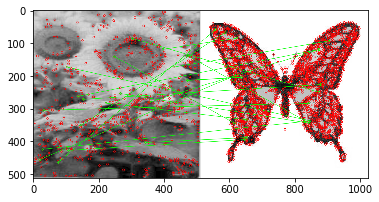

In [22]:
flann_match(1019)

1077


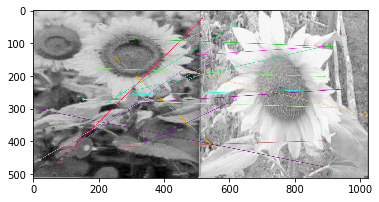

In [23]:
bf_match(1019)


As the calculation speed is slow, we need about 130 hours to calculate and compare all the pictures.
So we choose 10 pictures randomly as sample.

Result of Brute-Force

987
1077


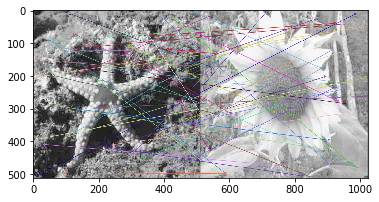

230
1077


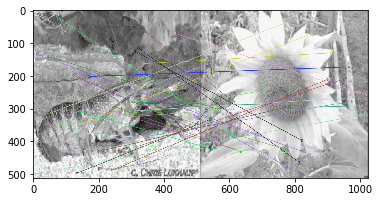

1043
1077


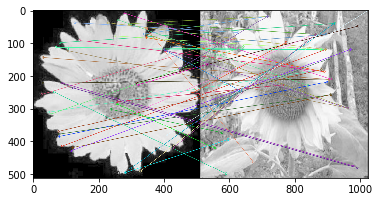

362
1077


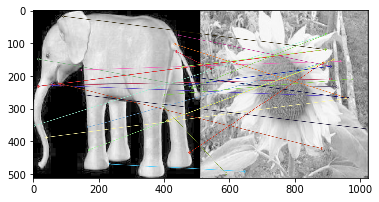

394
1077


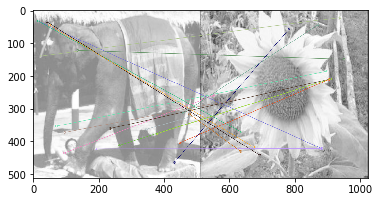

761
1077


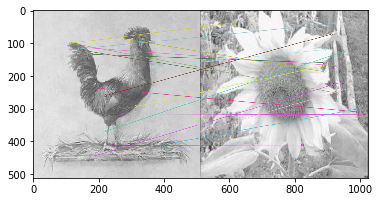

53
1077


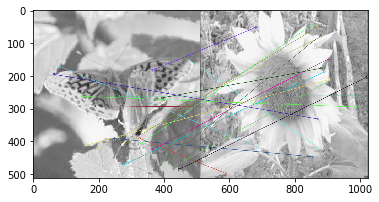

415
1077


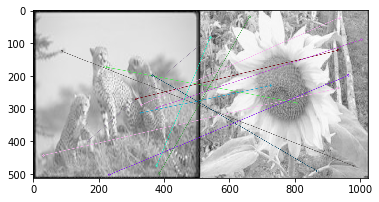

28
1077


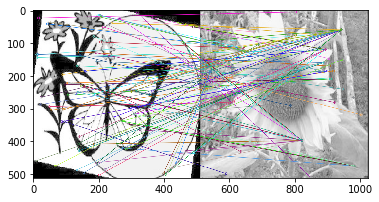

1027
1077


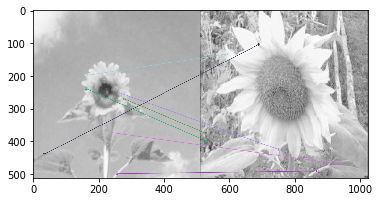

In [25]:
import random
sift_rand_n = random.sample(range(len(key_point)),10)
total_sift_n = 0
for sift_n in sift_rand_n:
    print(sift_n)
    bf_match(sift_n)
    

Result of FLANN

987


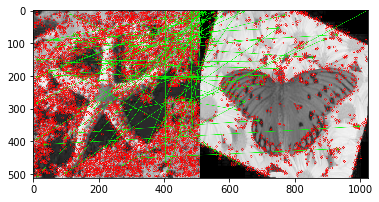

230


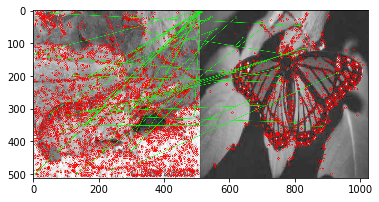

1043


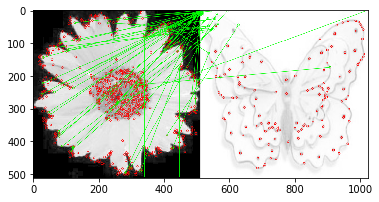

362


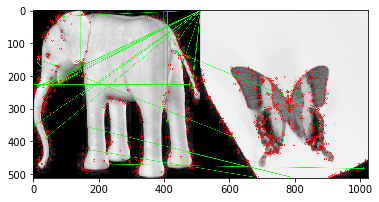

394


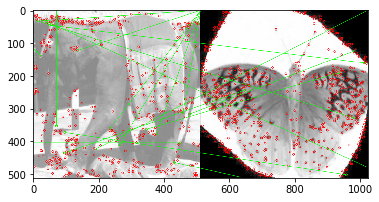

761


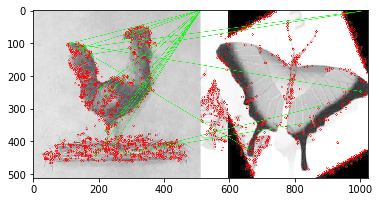

53


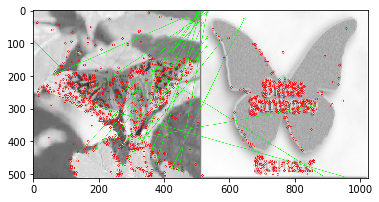

415


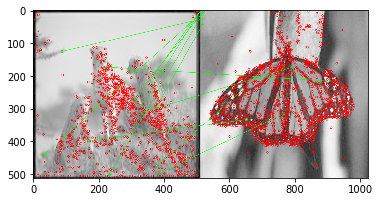

28


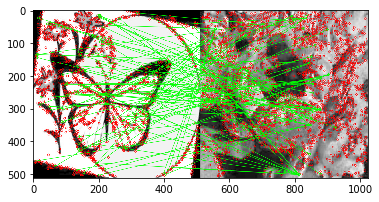

1027


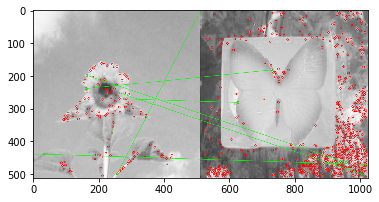

In [26]:
import random
for sift_n in [987,230,1043,362,394,761,53,415,28,1027]:
    print(sift_n)
    flann_match(sift_n)

Accoridng to the result, Brute-Force is better than FLANN in this dataset.
We use Brute-Force as classifier.

The differences between descriptions influence the precision of the matching process. 
If the difference is small enough, we can say these two descriptions are matched.
Changing the criterion of the difference measuring can improve or reduce the precision.

coeff is  0.4
987
1077


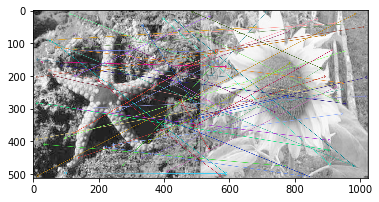

230
1077


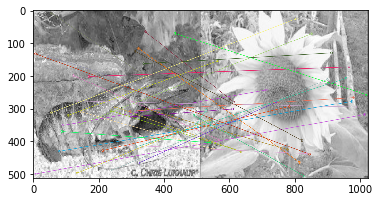

1043
1077


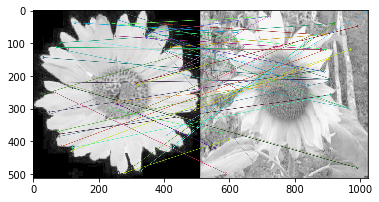

362
1077


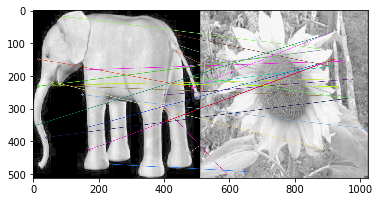

394
1077


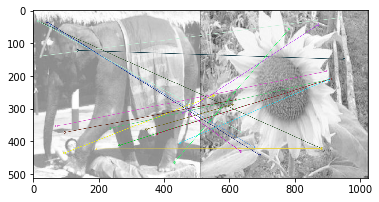

761
1077


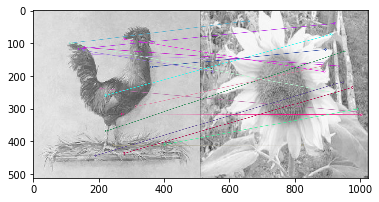

53
1077


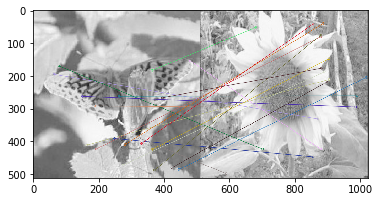

415
1077


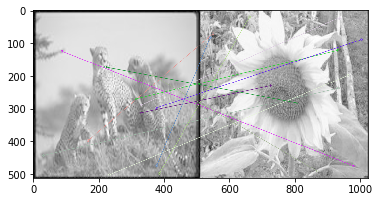

28
1077


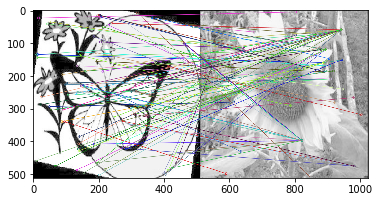

1027
1077


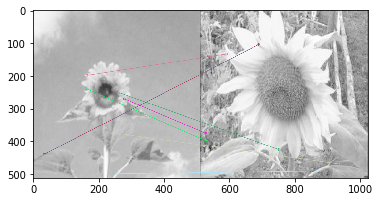

coeff is  0.5
987
1077


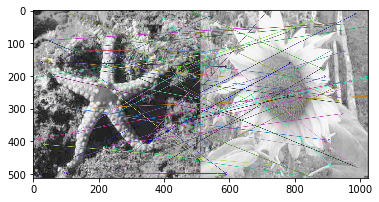

230
1077


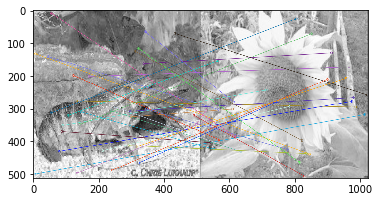

1043
1077


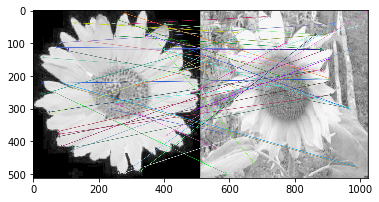

362
1077


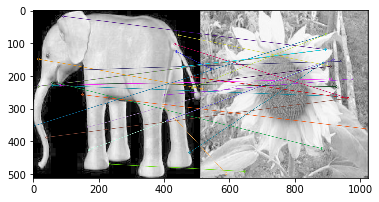

394
1077


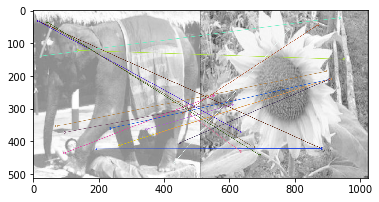

761
1077


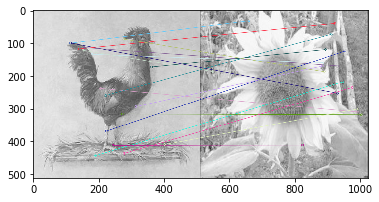

53
1077


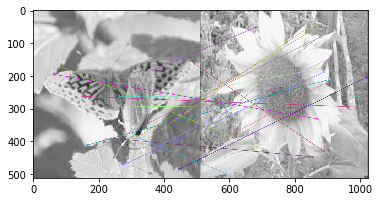

415
1077


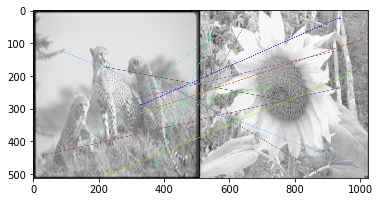

28
1077


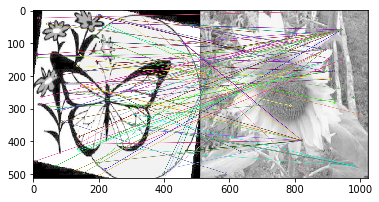

1027
1077


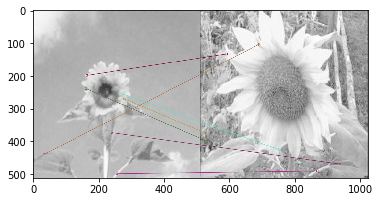

coeff is  0.6
987
1077


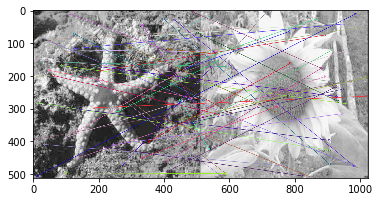

230
1077


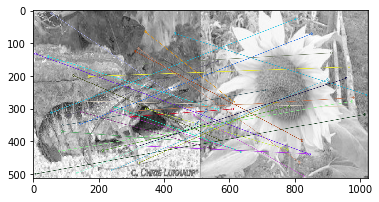

1043
1077


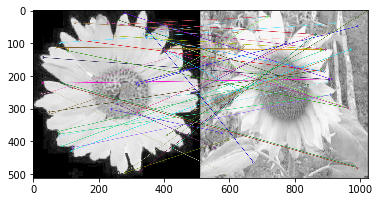

362
1077


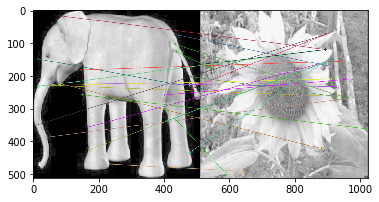

394
1077


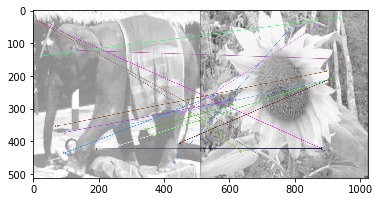

761
1077


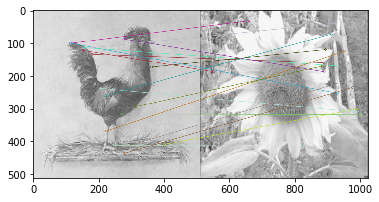

53
1077


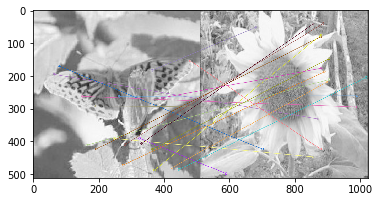

415
1077


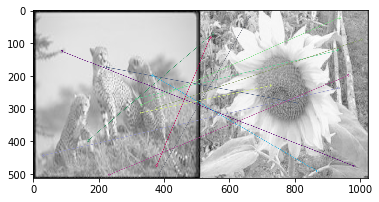

28
1077


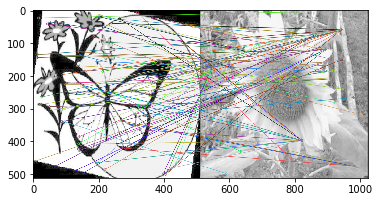

1027
1077


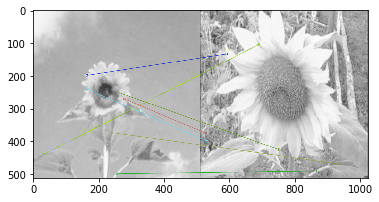

coeff is  0.7
987
1077


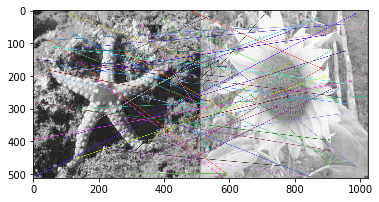

230
1077


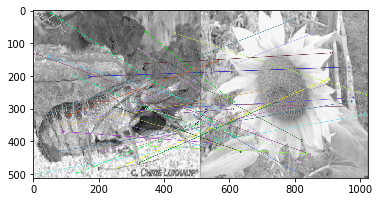

1043
1077


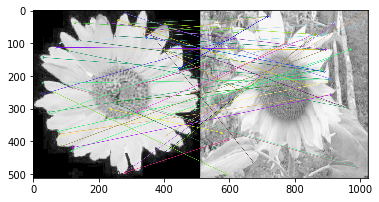

362
1077


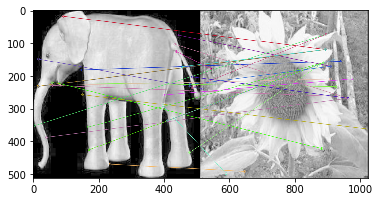

394
1077


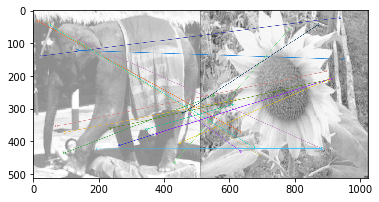

761
1077


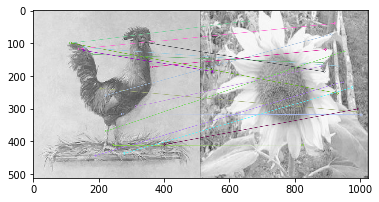

53
1077


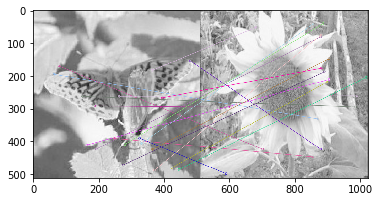

415
1077


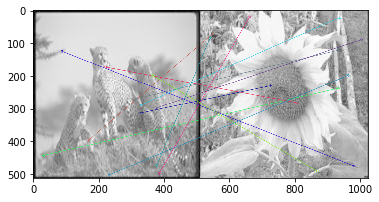

28
1077


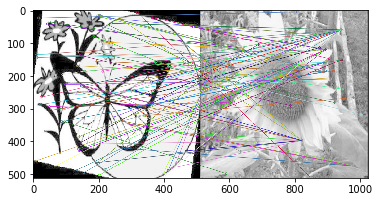

1027
1077


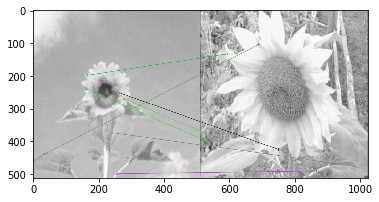

In [28]:
for coeff in np.arange(0.4,0.8,0.1):
    def bf_match_test(img_num):
        bf = cv2.BFMatcher()
        img_1 = key_point[img_num][2]
        des_1 = key_point[img_num][1]
        kp_1  = key_point[img_num][0]
        max_good = 0
        num = 0
        for p_n in range(len(key_point)):
            if p_n != img_num:
                img_2 = key_point[p_n][2]
                des_2 = key_point[p_n][1]
                kp_2  = key_point[p_n][0]
                matches_1 = bf.knnMatch(des_1,des_2, k=2) 
            # Apply ratio test
                good = []
                for m,n in matches_1:
                    if m.distance < coeff *n.distance:
                        good.append([m])
                if len(good) > max_good:
                    num = p_n
        print (num)
        img_2 = key_point[num][2]
        des_2 = key_point[num][1]
        kp_2  = key_point[num][0]
        matches_1 = bf.knnMatch(des_1,des_2, k=2) 
            # Apply ratio test
        good = []
        for m,n in matches_1:
            if m.distance < 0.8*n.distance:
                good.append([m])

            # output the images
            #img3 = cv2.drawMatchesKnn(img_1,kp_1,img_2,kp_2,good,flags=2)
        img3 = cv2.drawMatchesKnn(img_1,kp_1,img_2,kp_2,good,None,flags = 2)
        plt.imshow(img3)
        plt.show()

    print('coeff is ',coeff)
    for sift_n in [987,230,1043,362,394,761,53,415,28,1027]:
        print(sift_n)
        bf_match(sift_n)
    
    

According to the results, changing coefficient does not improve the results of nearest neigbor.

23


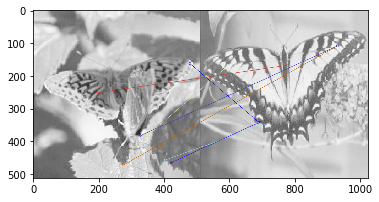

In [40]:
bf = cv2.BFMatcher()
img_1 = key_point[53][2]
des_1 = key_point[53][1]
kp_1  = key_point[53][0]
temp = 0
num_1 = 0
num_2 = 0
num_3 = 0
for p_n in range(len(key_point)):
    if p_n != 53:
        img_2 = key_point[p_n][2]
        des_2 = key_point[p_n][1]
        kp_2  = key_point[p_n][0]
        matches_1 = bf.knnMatch(des_1,des_2, k=2) 
        good = []
        for m,n in matches_1:
            if m.distance < 0.7*n.distance:
                good.append([m])
        if len(good) > num_3:
            num_3 = p_n
        if num_3 > num_2:
            temp = num_2
            num_2 = num_3
            num_3 = temp
        if num_2 > num_1:
            temp = num_1
            num_1 = num_2
            num_2 = temp
            
print (num_3)
img_2 = key_point[num_2][2]
des_2 = key_point[num_2][1]
kp_2  = key_point[num_2][0]
matches_1 = bf.knnMatch(des_1,des_2, k=2) 
good = []
for m,n in matches_1:
    if m.distance < 0.7*n.distance:
        good.append([m])
img3 = cv2.drawMatchesKnn(img_1,kp_1,img_2,kp_2,good,None,flags = 2)
plt.imshow(img3)
plt.show()

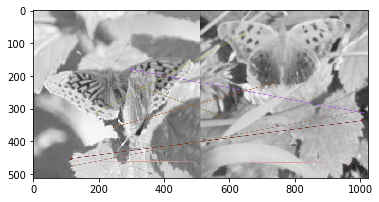

In [41]:
img_2 = key_point[num_3][2]
des_2 = key_point[num_3][1]
kp_2  = key_point[num_3][0]
matches_1 = bf.knnMatch(des_1,des_2, k=2) 
good = []
for m,n in matches_1:
    if m.distance < 0.7*n.distance:
        good.append([m])
img3 = cv2.drawMatchesKnn(img_1,kp_1,img_2,kp_2,good,None,flags = 2)
plt.imshow(img3)
plt.show()

In [45]:
def bf_match_2(img_num,coeff):
    bf = cv2.BFMatcher()
    img_1 = key_point[img_num][2]
    des_1 = key_point[img_num][1]
    kp_1  = key_point[img_num][0]
    temp = 0
    num_1 = 0
    num_2 = 0
    num_3 = 0
    for p_n in range(len(key_point)):
        if p_n != img_num:
            img_2 = key_point[p_n][2]
            des_2 = key_point[p_n][1]
            kp_2  = key_point[p_n][0]
            matches_1 = bf.knnMatch(des_1,des_2, k=2) 
        # Apply ratio test
            good = []
            for m,n in matches_1:
                if m.distance < coeff*n.distance:
                    good.append([m])
            if len(good) > num_3:
                num_3 = p_n
            if num_3 > num_2:
                temp = num_2
                num_2 = num_3
                num_3 = temp
            if num_2 > num_1:
                temp = num_1
                num_1 = num_2
                num_2 = temp
    for i in [num_1,num_2,num_3]:
        img_2 = key_point[i][2]
        des_2 = key_point[i][1]
        kp_2  = key_point[i][0]
        matches_1 = bf.knnMatch(des_1,des_2, k=2) 
            # Apply ratio test
        good = []
        for m,n in matches_1:
            if m.distance < coeff*n.distance:
                good.append([m])
        img3 = cv2.drawMatchesKnn(img_1,kp_1,img_2,kp_2,good,None,flags = 2)
        plt.imshow(img3)
        plt.show()

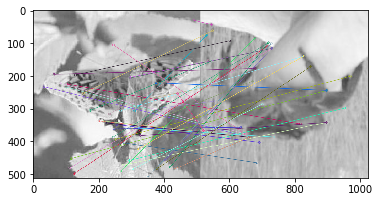

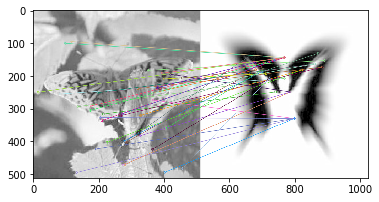

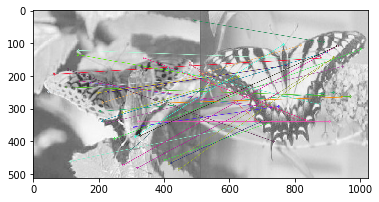

In [46]:
bf_match_2(53,0.8)

According to the results, some noises in the picture will inflect the matching result by adding the number of 
mathced keypoints.
If we want to implement SIFT, we should consider the second and third nearest neighbor.
So choosing coefficient should consider the second and third nearest neighbor.
In order to reduce the influence of noises, we should choose the medium coefficient so that the keypoints will not be too much or 
too small according to the sample.

## Conclusion

According to the result, we can get the following conclusion of SIFT:
1. The quality of pictures have big influence on the finall matching results.
   If there are too many noises, the keypoint matching will be interrupted.
2. The coefficient during the match process also have influence on the result.
   If the coefficient is small, we will not get enough keypoints. So the precision will be small.
   If the coefficient is big, the noises will produce more keypoints. It will also reduce the precision.
3. The nearest neighbor calculated by SIFT may not be the correct answer. Sometimes we need to compare 
   the second or the third neatest neighbor.

# Reference

1.https://docs.opencv.org/3.3.0/da/df5/tutorial_py_sift_intro.html
2.https://docs.opencv.org/3.0-beta/doc/py_tutorials/py_feature2d/py_matcher/py_matcher.html
3.http://www.vision.caltech.edu/Image_Datasets/Caltech101/#Description
4.https://en.wikipedia.org/wiki/Caltech_101
5.https://github.com/eclarson/MachineLearningNotebooks/blob/master/04.%20Dimension%20Reduction%20and%20Images.ipynb